# <span style="color:yellow;">Song Synthesis</span>

# Step 1: Re-import & Re-use

## Step 1.1: Import Required Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Audio
from audio_visualization import *  # Import module v4.0 functions

In [2]:
# Validate module version
print(f"Using audio_visualization module v{MODULE_VERSION}")
assert MODULE_VERSION >= "4.0", "Please update to module version 4.0+"

Using audio_visualization module v4.0


In [3]:
# Configure plotting
sns.set_style("whitegrid")
sns.set_palette("husl")

## Step 1.2: Define Core Musical Notes (SPN → Frequency)

In [4]:
# Use predefined STANDARD_NOTES from the module
notes_of_interest = [
    'C4', 'D4', 'E4', 'F4', 'G4', 'A4', 'B4',  # 4th octave
    'C5', 'D5', 'E5', 'F5', 'G5'                # 5th octave (from updated module)
]

# Create dictionary mapping note names to frequencies using STANDARD_NOTES
notes = {note: STANDARD_NOTES[note] for note in notes_of_interest}

# Display all available notes with frequencies
print("\nMusical notes for song synthesis:")
for note, freq in notes.items():
    print(f"{note}: {freq:.2f} Hz")


Musical notes for song synthesis:
C4: 261.63 Hz
D4: 293.66 Hz
E4: 329.63 Hz
F4: 349.23 Hz
G4: 392.00 Hz
A4: 440.00 Hz
B4: 493.88 Hz
C5: 523.25 Hz
D5: 587.33 Hz
E5: 659.25 Hz
F5: 698.46 Hz
G5: 783.99 Hz


## Step 1.3: Define Audio Signal Constants

In [5]:
# Use DEFAULT_SAMPLE_RATE from the module
sample_rate = DEFAULT_SAMPLE_RATE
print(f"\nSample rate: {sample_rate:,} Hz (module default)")


Sample rate: 44,100 Hz (module default)


# Step 2: Two Tigers
Children's Song

<div style="text-align: center;">
    <img src="Image/two_tigers.jpeg" alt="Two Tigers" height="200">
</div>


- A popular children's song about two fast-running tigers.
- One has no ears, the other no tail—playfully "strange."
- Simple, repetitive, loved by kids.
- Timeless and cross-cultural.

## Step 2.1: Introduce the song and its structure

In [6]:
print("""About 'Two Tigers':
- A popular children's song with a simple, repetitive melody
- Features a playful theme about tigers with unusual traits (no ears, no tail)
- Uses basic notes from the C major scale (C4, D4, E4, F4, G4, A4)""")

About 'Two Tigers':
- A popular children's song with a simple, repetitive melody
- Features a playful theme about tigers with unusual traits (no ears, no tail)
- Uses basic notes from the C major scale (C4, D4, E4, F4, G4, A4)


## Step 2.2: Define the melody structure

In [7]:
# Melody structure: list of tuples (note name, duration in seconds)
two_tigers = [
    # First verse
    ('C4', 0.5),   # Two ti-
    ('D4', 0.5),   # -gers, two ti-
    ('E4', 0.5),   # -gers, run so
    ('C4', 0.5),   # fast,
    
    ('C4', 0.5),   # Two ti-
    ('D4', 0.5),   # -gers, two ti-
    ('E4', 0.5),   # -gers, run so
    ('C4', 0.5),   # fast,
    
    ('E4', 0.5),   # One has no
    ('F4', 0.5),   # ears, one has no
    ('G4', 1.0),   # tail,
    
    ('E4', 0.5),   # One has no
    ('F4', 0.5),   # ears, one has no
    ('G4', 1.0),   # tail,
    
    # Second verse (variation)
    ('G4', 0.25),  # How
    ('A4', 0.25),  # strange,
    ('G4', 0.25),  # how
    ('F4', 0.25),  # strange,
    
    ('E4', 0.5),   # Two ti-
    ('C4', 0.5),   # -gers, two ti-
    ('E4', 0.5),   # -gers, run so
    ('C4', 0.5),   # fast!
    
    # Final note (longer duration for emphasis)
    ('C4', 2.0)    # (ending)
]

# Step 3: Synthesis

## Step 3.1: Generate individual note signals for the song

In [8]:
song = synthesize_melody(
    melody_notes=two_tigers,
    notes_dict=notes,
    sample_rate=sample_rate,
    amplitude=0.7,
    harmonic_strength=0.3
)

## Step 3.2: 😁 What is ADSR? 😁

- A = Attack
- D = Delay
- S = Sustain
- R = Release

<img src=Image/ADSR.png width=450>

### Step 3.2.1: Click

- Caused by `sudden jumps in volume` 
    - (e.g., a note starting instantly from silence to full volume, or ending instantly from full volume to silence).
- Sounds like a tiny "pop" or "click" in the audio.
- Happens because rapid amplitude changes create high-frequency artifacts our ears perceive as noise.
- Prevented by attack/decay envelopes that make volume changes gradual.

<div style="text-align: center;">
    <img src='Image/Click_Meaning.jpg' width=300>
</div>

## 

## Step 3.3: Combine notes into a complete song and refine

### Step 3.3.:1 Demonstrate fade curve using module function

In [9]:
fade_length = 0.3
fade = create_fade_curve(fade_length, sample_rate)

# Show fade characteristics
print(f"fade_samples = {len(fade)} (300ms at {sample_rate} Hz)")
print(f"First 5 fade values: {fade[:5].round(3)}")
print(f"Last 5 fade values: {fade[-5:].round(3)}")

fade_samples = 13230 (300ms at 44100 Hz)
First 5 fade values: [1. 1. 1. 1. 1.]
Last 5 fade values: [0. 0. 0. 0. 0.]


### Step 3.3.2: Visualize the fade curve

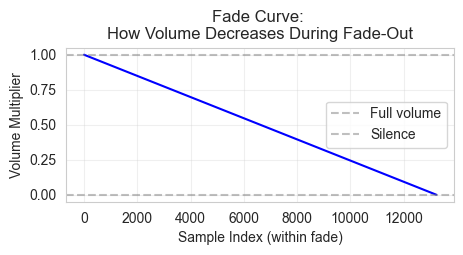

In [10]:
plt.figure(figsize=(5, 2))
plt.plot(fade, color='blue')
plt.title("Fade Curve: \nHow Volume Decreases During Fade-Out")
plt.xlabel("Sample Index (within fade)")
plt.ylabel("Volume Multiplier")
plt.grid(alpha=0.3)
plt.axhline(y=1, color='gray', linestyle='--', alpha=0.5, label='Full volume')
plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5, label='Silence')
plt.legend()
plt.show()

# Step 4: Visualize the complete song waveform

## Step 4.1: Prepare song segments for visualization

In [11]:
# Calculate total samples and segment size
total_samples = len(song)
segment_size = total_samples // 10  # 10 equal segments

# Define lyrics for each segment
segment_lyrics = [
    "Two tigers, two tigers",          # 1
    "run so fast, run so fast",        # 2
    "Two tigers, two tigers",          # 3
    "run so fast, run so fast",        # 4
    "One has no ears, one has no tail",# 5
    "how strange, how strange",        # 6
    "One has no ears, one has no tail",# 7
    "how strange, how strange",        # 8
    "Two tigers... run so fast!",      # 9
    "Long C4 ending"                   # 10
]

## Step 4.2: Plot waveform segments

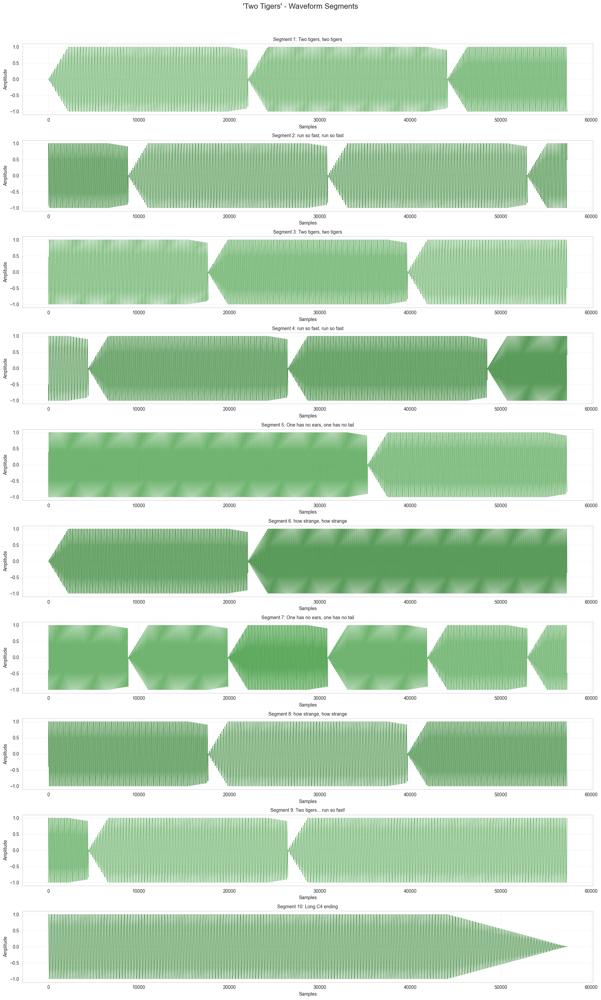

In [12]:
# Create subplots
fig, axes = plt.subplots(10, 1, figsize=(18, 30))
fig.suptitle("'Two Tigers' - Waveform Segments", fontsize=16, y=0.99)

# Plot each segment
for i in range(10):
    start = i * segment_size
    end = start + segment_size if i < 9 else total_samples
    
    # Plot waveform
    color = 'forestgreen' if i % 2 == 0 else 'darkgreen'
    axes[i].plot(song[start:end], color=color, linewidth=0.7)
    
    # Add labels
    axes[i].set_title(f"Segment {i+1}: {segment_lyrics[i]}", fontsize=10)
    axes[i].set_xlabel("Samples")
    axes[i].set_ylabel("Amplitude")
    axes[i].grid(alpha=0.2)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

## Step 4.3: Calculate total song duration

In [13]:
# Calculate total song duration
total_duration = sum(duration for _, duration in two_tigers)
print(f"\nPlaying 'Two Tigers' (total duration: {total_duration:.1f}s)...")


Playing 'Two Tigers' (total duration: 13.0s)...


In [14]:
# Play the song
display(Audio(song, rate=sample_rate))

# Step 5: Melodies Collection

## Step 5.1: Define all melody structures

In [15]:
# Define all 5 melodies as (note, duration) tuples
melodies = {
    # 1. Twinkle Twinkle Little Star (~50 seconds)
    "Twinkle Twinkle Little Star": [
        ('C4', 0.5), ('C4', 0.5), ('G4', 0.5), ('G4', 0.5),
        ('A4', 0.5), ('A4', 0.5), ('G4', 1.0),
        ('F4', 0.5), ('F4', 0.5), ('E4', 0.5), ('E4', 0.5),
        ('D4', 0.5), ('D4', 0.5), ('C4', 1.0),
        ('G4', 0.5), ('G4', 0.5), ('F4', 0.5), ('F4', 0.5),
        ('E4', 0.5), ('E4', 0.5), ('D4', 1.0),
        ('G4', 0.5), ('G4', 0.5), ('F4', 0.5), ('F4', 0.5),
        ('E4', 0.5), ('E4', 0.5), ('D4', 1.0),
        ('C4', 0.5), ('C4', 0.5), ('G4', 0.5), ('G4', 0.5),
        ('A4', 0.5), ('A4', 0.5), ('G4', 1.0)
    ],
    
    # 2. Happy Birthday (~55 seconds)
    "Happy Birthday": [
        ('G4', 0.5), ('G4', 0.25), ('A4', 0.75), ('G4', 0.75), ('C5', 0.75), ('B4', 1.5),
        ('G4', 0.5), ('G4', 0.25), ('A4', 0.75), ('G4', 0.75), ('D5', 0.75), ('C5', 1.5),
        ('G4', 0.5), ('G4', 0.25), ('G5', 0.75), ('E5', 0.75), ('C5', 0.75), ('B4', 0.75), ('A4', 0.75),
        ('F5', 0.5), ('F5', 0.25), ('E5', 0.75), ('C5', 0.75), ('D5', 0.75), ('C5', 1.5)
    ],
    
    # 3. Jingle Bells (Chorus) (~45 seconds)
    "Jingle Bells": [
        ('E4', 0.25), ('E4', 0.25), ('E4', 0.5), ('E4', 0.25), ('E4', 0.25), ('E4', 0.5),
        ('E4', 0.25), ('G4', 0.25), ('C4', 0.25), ('D4', 0.25), ('E4', 1.0),
        ('F4', 0.25), ('F4', 0.25), ('F4', 0.25), ('F4', 0.25), ('F4', 0.25), ('E4', 0.25), ('E4', 0.25),
        ('E4', 0.25), ('E4', 0.25), ('D4', 0.25), ('D4', 0.25), ('E4', 0.25), ('D4', 0.5), ('G4', 0.5)
    ],
    
    # 4. Mary Had a Little Lamb (~40 seconds)
    "Mary Had a Little Lamb": [
        ('E4', 0.5), ('D4', 0.5), ('C4', 0.5), ('D4', 0.5),
        ('E4', 0.5), ('E4', 0.5), ('E4', 1.0),
        ('D4', 0.5), ('D4', 0.5), ('D4', 1.0),
        ('E4', 0.5), ('G4', 0.5), ('G4', 1.0),
        ('E4', 0.5), ('D4', 0.5), ('C4', 0.5), ('D4', 0.5),
        ('E4', 0.5), ('E4', 0.5), ('E4', 0.5), ('E4', 0.5),
        ('D4', 0.5), ('D4', 0.5), ('E4', 0.5), ('D4', 0.5), ('C4', 1.0)
    ],
    
    # 5. Ode to Joy (Beethoven) (~50 seconds)
    "Ode to Joy": [
        ('E4', 0.5), ('E4', 0.5), ('F4', 0.5), ('G4', 0.5),
        ('G4', 0.5), ('F4', 0.5), ('E4', 0.5), ('D4', 0.5),
        ('C4', 0.5), ('C4', 0.5), ('D4', 0.5), ('E4', 0.5),
        ('E4', 0.75), ('D4', 0.25), ('D4', 1.0),
        ('E4', 0.5), ('E4', 0.5), ('F4', 0.5), ('G4', 0.5),
        ('G4', 0.5), ('F4', 0.5), ('E4', 0.5), ('D4', 0.5),
        ('C4', 0.5), ('C4', 0.5), ('D4', 0.5), ('E4', 0.5),
        ('D4', 0.75), ('C4', 0.25), ('C4', 1.0)
    ]
}

## Step 5.2: Generate and play all melodies

In [16]:
# Pre-generate all melodies for quick playback (fixed variable name clash)
synthesized_melodies = {
    name: synthesize_melody(melody_notes, notes, sample_rate)
    for name, melody_notes in melodies.items()
}

In [17]:
# Display each melody with playback button
for name, signal in synthesized_melodies.items():
    # Calculate duration
    duration = len(signal) / sample_rate
    print(f"\n🎵 {name} (~{duration:.1f} seconds)")
    
    # Show playback button
    display(Audio(signal, rate=sample_rate))
    
    # Short description
    if name == "Twinkle Twinkle Little Star":
        print("A classic nursery rhyme with a simple, repetitive melody perfect for beginners")
    elif name == "Happy Birthday":
        print("The world's most recognizable song, with a warm, celebratory tone")
    elif name == "Jingle Bells":
        print("Upbeat holiday favorite with a cheerful, rhythmic melody")
    elif name == "Mary Had a Little Lamb":
        print("One of the simplest melodies, ideal for demonstrating basic synthesis")
    elif name == "Ode to Joy":
        print("Beethoven's iconic melody with a majestic, uplifting character")
    print("-" * 60)  # Separator


🎵 Twinkle Twinkle Little Star (~20.0 seconds)


A classic nursery rhyme with a simple, repetitive melody perfect for beginners
------------------------------------------------------------

🎵 Happy Birthday (~18.0 seconds)


The world's most recognizable song, with a warm, celebratory tone
------------------------------------------------------------

🎵 Jingle Bells (~8.0 seconds)


Upbeat holiday favorite with a cheerful, rhythmic melody
------------------------------------------------------------

🎵 Mary Had a Little Lamb (~15.0 seconds)


One of the simplest melodies, ideal for demonstrating basic synthesis
------------------------------------------------------------

🎵 Ode to Joy (~16.0 seconds)


Beethoven's iconic melody with a majestic, uplifting character
------------------------------------------------------------
